# Week 9: Spherical Collapse & the Nonlinear Regime
**Astrophysics II — Spring 2026**

---
## Warm-up: Three Questions

Before the corrections, make sure you can answer these:

**1.** A mass shell has total specific energy $E = \frac{1}{2}\dot{r}^2 - \frac{GM}{r}$.
What does $E < 0$ mean physically? Why is it the only case that collapses?

<details>
<summary>Answer</summary>

$E < 0$ means the shell is **gravitationally bound** — its kinetic energy is smaller than
the gravitational potential well. Just like a bound orbit, the shell must eventually turn around
and fall back in. For $E \geq 0$, the shell has enough energy to escape to infinity, so it
expands forever and never collapses.
</details>

---

**2.** What is the Lagrangian radius $r_l(t)$, and how does it differ from the actual shell radius $r(t)$?

<details>
<summary>Answer</summary>

$r_l(t)$ is the radius that a comoving sphere of the **same mass** $M$ would have in a perfectly
uniform background universe: $r_l^3(t) = 3M/(4\pi\bar\rho(t))$. It simply tracks the background
expansion. The actual shell radius $r(t)$ deviates from $r_l$ due to the overdensity.
Their ratio encodes the real density contrast: $\delta = (r_l/r)^3 - 1$.
</details>

---

**3.** Why is $\delta_c \approx 1.686$ such a special number in structure formation?

<details>
<summary>Answer</summary>

It is the **linearly-extrapolated** density contrast at the moment of spherical collapse ($\theta = 2\pi$).
Even though the real overdensity diverges ($\delta \to \infty$ as $r \to 0$), linear theory
predicts a finite value $\delta_c \approx 1.686$. This threshold is used in Press-Schechter theory:
any region where the RMS of the overdensity field smoothed on scale R $\sigma_R > \delta_c$ is considered to have already collapsed into a halo.
</details>

---
## Physical Intuition: The Spherical Collapse Model

We consider a single spherical **mass shell** at radius $r$ from the centre of an overdensity.
The setup makes two simplifying assumptions:
- **Shell-crossing neglected:** mass shells move independently (valid until they start crossing).
- **Enclosed mass constant:** $M$ does not change as the shell moves.

Because $M$ is constant, the **total specific energy** is also conserved:
$$E = \frac{1}{2}\left(\frac{dr}{dt}\right)^2 - \frac{GM}{r} = \text{const}$$

Think of this as a **1D particle in the potential** $V(r) = -GM/r$. The sign of $E$ decides everything:

| Energy | Fate | Orbital analogy |
|---|---|---|
| $E = 0$ | Expands forever (just barely) | Parabolic escape trajectory |
| $E > 0$ | Expands forever | Hyperbolic (unbound) orbit |
| $E < 0$ | Turns around, **collapses** | Elliptic (bound) orbit |

#

> **Key point:** Only $E < 0$ leads to a finite turnaround radius and eventual collapse.
> From here on we consider only this case.

---
### Visualizing the Lagrangian Radius

Two radii evolve in parallel during spherical collapse:

| Radius | What it tracks | Behaviour |
|---|---|---|
| $r(t)$ | Actual shell | Expands, turns around at $\theta=\pi$, collapses |
| $r_l(t)$ | **Lagrangian radius** — same mass shell *if* the universe stayed homogeneous | Always expands as $r_l \propto t^{2/3}$ |

The overdensity is the gap between them:
$$\delta(t) = \left(\frac{r_l(t)}{r(t)}\right)^3 - 1$$

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


plt.rcParams['text.usetex'] = True

# Cycloid (A=B=1)
phi    = np.linspace(0, 2*np.pi, 300)
th_l   = np.linspace(1e-3, 1.9*np.pi, 500)
r_shell = 1 - np.cos(th_l)

# Lagrangian radius: r_l ∝ t^(2/3) in matter domination
#   normalized so r_l(t_ta)/r(t_ta) = (1 + δ_ta)^(1/3), δ_ta = (3π/4)^2 - 1
r_l_ta  = ((3*np.pi/4)**2)**(1/3) * 2   # = (3π/4)^(2/3) * 2  ≈ 3.54
r_l     = r_l_ta * ((th_l - np.sin(th_l)) / np.pi)**(2/3)

with np.errstate(divide='ignore', invalid='ignore'):
    delta_nl = np.where(r_shell > 1e-4, (r_l / r_shell)**3 - 1, np.nan)

# ── Figure ────────────────────────────────────────────────────────────────────
bg = '#1a1a2e'
fig_l, ax = plt.subplots(figsize=(6, 6))
fig_l.patch.set_facecolor(bg)
ax.set_facecolor(bg)
for sp in ax.spines.values(): sp.set_edgecolor('#333')

rmax = r_l[-1] * 1.12
ax.set_xlim(-rmax, rmax); ax.set_ylim(-rmax, rmax)
ax.set_aspect('equal'); ax.axis('off')
ax.set_title(r'Lagrangian Radius $r_l$ vs Shell Radius$r$',
             pad=10, fontsize=12, color='white')

# faint ghost: r_l at turnaround (reference scale)
ax.plot(r_l_ta*np.cos(phi), r_l_ta*np.sin(phi),
        color='tomato', alpha=0.10, lw=1, ls='--')
ax.plot(0, 0, 'o', color='white', ms=4, zorder=5)

circ_rl, = ax.plot([], [], lw=2,   ls='--', color='tomato',
                   label=r'$r_l(t)$  Lagrangian')
circ_r,  = ax.plot([], [], lw=2.5,          color='steelblue',
                   label=r'$r(t)$  Shell')

lbl_d  = ax.text(-5, -rmax*0.82, '', color='white',   fontsize=13,
                 ha='center', va='bottom', fontweight='bold')
lbl_th = ax.text(-5,  rmax*0.90, '', color='#aaaaaa', fontsize=10,
                 ha='center', va='top')

ax.legend(loc='lower right', fontsize=10,
          facecolor=bg, labelcolor='white', edgecolor='#444')

n_fr = 180

def _upd(frame):
    i  = min(int(frame / (n_fr - 1) * (len(th_l) - 1)), len(th_l) - 1)
    ri = r_shell[i];  rli = r_l[i]
    circ_r.set_data( ri  * np.cos(phi),  ri  * np.sin(phi))
    circ_rl.set_data(rli * np.cos(phi), rli * np.sin(phi))
    dv = delta_nl[i]
    lbl_d.set_text(rf'$\delta = {dv:.2f}$' if np.isfinite(dv) else r'$\delta \to \infty$')
    lbl_th.set_text(rf'$\theta = {th_l[i]/np.pi:.2f}\pi$')
    return circ_r, circ_rl, lbl_d, lbl_th

ani_lagr = animation.FuncAnimation(fig_l, _upd, frames=n_fr, interval=60, blit=True)
plt.tight_layout()
plt.close(fig_l)
HTML(ani_lagr.to_jshtml())

Turnaround at θ=π :  r = 2A  (maximum radius)
Collapse at θ=2π  :  r = 0   (shell falls to centre)


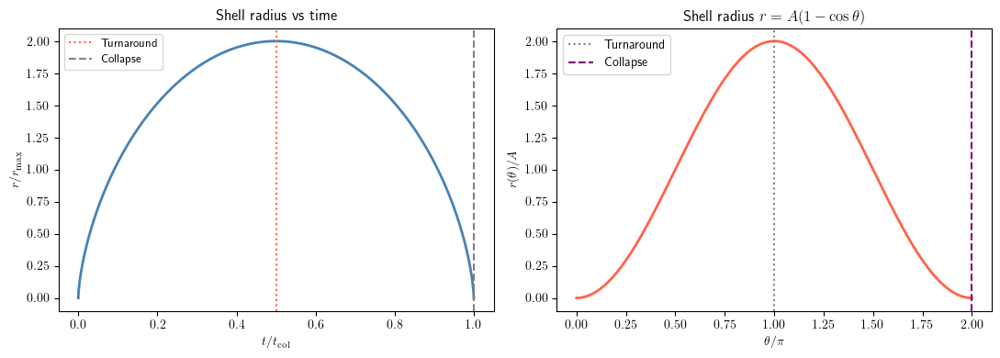

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.integrate import cumulative_trapezoid
from IPython.display import HTML

print(r'Turnaround at θ=π :  r = 2A  (maximum radius)')
print(r'Collapse at θ=2π  :  r = 0   (shell falls to centre)')

# Cycloid parametric solution (E < 0, A=B=1)
theta = np.linspace(0, 2*np.pi, 1000)
r_cyc = 1 - np.cos(theta)        # r/A
t_cyc = theta - np.sin(theta)    # t/B

fig, axes = plt.subplots(1, 2, figsize=(11, 4))

axes[0].plot(t_cyc / (2*np.pi), r_cyc, lw=2, color='steelblue')
axes[0].axvline(0.5, ls=':', color='tomato',  label=r'Turnaround')
axes[0].axvline(1.0, ls='--', color='gray',   label=r'Collapse')
axes[0].set_xlabel(r'$t / t_{\rm col}$')
axes[0].set_ylabel(r'$r / r_{\rm max}$')
axes[0].set_title('Shell radius vs time')
axes[0].legend(fontsize=9)

axes[1].plot(theta/np.pi, r_cyc, lw=2, color='tomato')
axes[1].axvline(1.0, ls=':', color='gray',     label=r'Turnaround')
axes[1].axvline(2.0, ls='--', color='purple',  label=r'Collapse')
axes[1].set_xlabel(r'$\theta / \pi$')
axes[1].set_ylabel(r'$r(\theta) / A$')
axes[1].set_title(r'Shell radius $r = A(1-\cos\theta)$')
axes[1].legend()

plt.tight_layout()
plt.show()

---
## Exercise 1 — Corrections

### Part 1: Solving the Energy Equation

**Case $E = 0$.** The equation $0 = \frac{1}{2}\dot r^2 - GM/r$ is separable:
$$\sqrt{2GM}\,dt = \sqrt{r}\,dr \implies \sqrt{2GM}\,t = \frac{2}{3}r^{3/2}$$
$$\boxed{r(t) = \left(3t\sqrt{\frac{GM}{2}}\right)^{2/3}}$$
This grows forever, there's no turnaround.

---

**Case $E \neq 0$.** We verify the parametric ansatz $r = A(1-\cos\theta)$, $t = B(\theta - \sin\theta)$.

Compute $dr/dt$ via the chain rule:
$$\frac{dr}{dt} = \frac{d\theta}{dt}\frac{dt}{d\theta} = \frac{A\sin\theta}{B(1-\cos\theta)}$$

Substitute into $E = \frac{1}{2}(dr/dt)^2 - GM/r$:
$$E = \frac{A^2\sin^2\theta}{2B^2(1-\cos\theta)^2} - \frac{GM}{A(1-\cos\theta)}$$

Multiply through by $(1-\cos\theta)^2$ and use $\sin^2\theta = 1 - \cos^2\theta$.
For this to hold for **all** $\theta \in [0, 2\pi]$, the coefficients on the LHS and the RHS must match independently:

$$\boxed{
\frac{A^2}{2B^2} - \frac{GM}{A} = E, \qquad \frac{GM}{A} = -2E, \qquad -\frac{A^2}{2B^2} = E}$$

For $E > 0$ we find an unphysical result
\begin{align}
A &= -\frac{GM}{2E} \tag{12} \\
B &= i\,\frac{GM}{(2E)^{3/2}} \tag{13}
\end{align}
whereas for $E < 0$
\begin{align}
A &= \frac{GM}{2|E|} \tag{14} \\
B &= \frac{GM}{(2|E|)^{3/2}} \tag{15}
\end{align}

> **Common mistake:** For $E > 0$, $B$ becomes imaginary, the parametric solution has no
> real trajectory. Only $E < 0$ gives real $A, B > 0$ and a physical collapsing solution.

**What happens at special $\theta$ values?**
- $\theta = \pi$: $r = 2A$ $\rightarrow$ maximum radius (turnaround), $\dot r = 0$
- $\theta = 2\pi$: $r = 0$ $\rightarrow$ collapse, $t_{\rm col} = 2\pi B$

Note also that $t_{\rm ta} = \pi B$, so $t_{\rm col} = 2\,t_{\rm ta}$: **collapse takes twice as long as reaching turnaround.**

### Part 2: Cosmological Initial Conditions

We express $A$ and $B$ in terms of the initial state $(r_i, v_i)$ and cosmological
parameters $(\Omega_i, H_i, \delta_i)$.

**Step 1 — evaluate $E$ at $t = t_i$:**
$$E = \frac{1}{2}v_i^2 - \frac{GM}{r_i}$$

**Step 2 — express $M$ in terms of cosmology.**
The mass enclosed is $M = \frac{4\pi r_i^3}{3}\rho_i = \frac{4\pi r_i^3}{3}\bar\rho_i(1+\delta_i)$.
Using the Friedmann equation $\bar\rho_i = 3\Omega_i H_i^2 / (8\pi G)$:
$$M = \frac{r_i^3\,\Omega_i(1+\delta_i)H_i^2}{2G}$$

**Plugging in:**
$$A = \frac{r_i^3(1+\delta_i)\Omega_i H_i^2}{2\left[r_i^2(1+\delta_i)\Omega_i H_i^2 - v_i^2\right]}$$
$$B = \frac{r_i^3\,\Omega_i(1+\delta_i)H_i^2}{\left[2\left(r_i^2\Omega_i(1+\delta_i)H_i^2 - v_i^2\right)\right]^{3/2}}$$

### Part 3a: Linear Approximation — Rewriting in Terms of $\delta_l$ and $r_l$

For sufficiently early times ($\delta_i \ll 1$), we linearise in $\delta_i$ and use
the three hints provided in the problem sheet.

**The three hints in matter domination:**
1. The curvature term grows with the scale factor $\rightarrow$ $(1 - \Omega_t^{-1}) \propto a$ 
2. The Lagrangian radius $r_l$ follows the background $\rightarrow$ $r_l(t) \approx r_i\,a(t)/a(t_i)$ (This does not really come from Matter domination (?))
3. From Friedmann $\rightarrow$ $t_i^{-1} \approx \frac{3}{2}\,\Omega_t^{1/2}\,H(t)\,[a(t)/a(t_i)]^{3/2}$

Substituting into the expressions for $A$ and $B$ from the problem sheet:

$$A = \frac{1}{2}\frac{r_i}{5\delta(t_i)/3 + 1 - \Omega_i^{-1}} \longrightarrow
A = \frac{1}{2}\frac{r_l}{5\delta_l/3 + 1 - \Omega_t^{-1}}$$

$$B = \frac{3}{4}\frac{t_i}{[5\delta(t_i)/3+1-\Omega_i^{-1}]^{3/2}} \longrightarrow
B = \frac{1}{2H(t)\Omega_t^{1/2}}\frac{1}{[5\delta_l/3+1-\Omega_t^{-1}]^{3/2}}$$

where we used hint 3 to replace $t_i$ and hints 1–2 to pull out the $a$ factors.

Inserting back into $r = A(1-\cos\theta)$ and $t = B(\theta - \sin\theta)$:

$$\boxed{r = \frac{r_l(1 - \cos\theta)}{2\left[5\delta_l/3 + 1 - \Omega_t^{-1}\right]}}$$

$$\boxed{t = \frac{\theta - \sin\theta}{2H(t)\,\Omega_t^{1/2}\,\left[5\delta_l/3 + 1 - \Omega_t^{-1}\right]^{3/2}}}$$

**The key observation:** the combination $\left(5\delta_l/3 + 1 - \Omega_t^{-1}\right)$ appears
in **both** equations. This will allow us to eliminate it between the two and solve for $\delta_l$.

### Part 3b: Linear Density Contrast at Turnaround, $\delta_l(t_{\rm ta})$

**Turnaround:** $r$ is maximal when $dr/d\theta = 0$, which happens at $\theta = \pi$
($\sin\pi = 0$, $\cos\pi = -1$).

**Step 1 — solve for the key combination from the time equation.**
At $\theta = \pi$:
$$5\delta_l/3 + 1 - \Omega_t^{-1} = \left(\frac{\pi}{2H(t)t\,\Omega_t^{1/2}}\right)^{2/3}$$

**Step 2 — find $r/r_l$ from the radius equation.**
At $\theta = \pi$:
$$\frac{r}{r_l} = \frac{1}{5\delta_l/3 + 1 - \Omega_t^{-1}} = \left(\frac{2H(t)t\,\Omega_t^{1/2}}{\pi}\right)^{2/3}$$

**Step 3 — solve for $\delta_l$.**
From Step 1:
$$\delta_l(t_{\rm ta}) = \frac{3}{5}\left[\left(\frac{\pi}{2H(t)t\,\Omega_t^{1/2}}\right)^{2/3} - (1 - \Omega_t^{-1})\right]$$

**Flat universe** ($\Omega_t = 1$) with $Ht \approx 2/3$ in matter domination (since $a(t) \propto t^{2/3}$):
$$\delta_l(t_{\rm ta}) = \frac{3}{5}\left(\frac{3\pi}{4}\right)^{2/3} \approx \boxed{1.06}$$

> **Sanity check:** $\delta_l \approx 1$ at turnaround tells us that by the time a region reaches
> maximum size, the linear approximation is already marginal ($\delta_l \sim 1$ is the edge of
> linear regime). The real density contrast at this point is much larger — see Part 3c.

### Part 3c: Real Density Contrast at Turnaround, $\delta(t_{\rm ta})$

The real local density $\rho(t) = \bar\rho(t)\,[r_l/r]^3$ (mass conservation in a sphere).
Therefore:
$$\delta(t_{\rm ta}) = \left[\frac{r_l(t_{\rm ta})}{r(t_{\rm ta})}\right]^3 - 1$$

From Part 3b, we found $r/r_l = (2Ht\,\Omega_t^{1/2}/\pi)^{2/3}$, so:
$$\delta(t_{\rm ta}) = \left(\frac{\pi}{2H(t)t\,\Omega_t^{1/2}}\right)^2 - 1$$

For a flat universe with $Ht = 2/3$:
$$\delta(t_{\rm ta}) = \left(\frac{3\pi}{4}\right)^2 - 1 \approx \boxed{4.55}$$

**Is linear theory sufficient?** Clearly no: the real $\delta \approx 4.55$ versus the linear
prediction $\delta_l \approx 1.06$. They have diverged by a factor of $\sim 4$.
The region is already deeply in the nonlinear regime at turnaround.

| Theory | $\delta$ at turnaround |
|---|---|
| Linear extrapolation | $\delta_l \approx 1.06$ |
| Spherical collapse (exact) | $\delta \approx 4.55$ |

#

> **Physical picture:** At turnaround the shell has been decelerating relative to the background
> for a long time. The real density has grown steeply (compressed volume $\propto (r_l/r)^3$),
> while linear theory only captures the early, gentle growth.

### Part 4: Linear Density Contrast at Collapse, $\delta_l(t_{\rm col}) \approx 1.686$

At collapse, $r = 0$, which corresponds to $\theta = 2\pi$ (since $\cos 2\pi = 1 \Rightarrow r = 0$).

The time equation at $\theta = 2\pi$: $\theta - \sin\theta = 2\pi$, so:
$$5\delta_l/3 + 1 - \Omega_t^{-1} = \left(\frac{2\pi}{2H(t)t\,\Omega_t^{1/2}}\right)^{2/3}
= \left(\frac{\pi}{H(t)t\,\Omega_t^{1/2}}\right)^{2/3}$$

Solving for $\delta_l$:
$$\delta_l(t_{\rm col}) = \frac{3}{5}\left[\left(\frac{\pi}{\Omega_t^{1/2}H(t)t}\right)^{2/3}
- (1-\Omega_t^{-1})\right]$$

Flat universe, $Ht = 2/3$ and $\Omega_t = 1$:
$$\delta_l(t_{\rm col}) = \frac{3}{5}\left(\frac{3\pi}{2}\right)^{2/3} \approx \boxed{\delta_c = 1.686}$$

Note also $t_{\rm col} = B \cdot 2\pi = 2 \cdot (B\pi) = 2\,t_{\rm ta}$, confirming $t_{\rm col} = 2\,t_{\rm ta}$.

**Why $\delta_c = 1.686$ matters so much:**

This number bridges linear theory and nonlinear structure. Even though the *actual* density
diverges at collapse, **linear theory predicts a finite threshold**.
Press-Schechter theory (next week) uses this directly:

> A region of the universe with smoothed variance $\sigma_R > \delta_c$
> is predicted to have already collapsed into a halo.

This connects the cleanly-calculable linear power spectrum $P(k)$ to the observable
abundance of galaxy clusters and groups.

δ_l(turnaround) = 1.062   (≈ 1.06)
δ  (turnaround) = 4.552   (≈ 4.55)
δ_l(collapse)   = 1.686   (≈ 1.686)


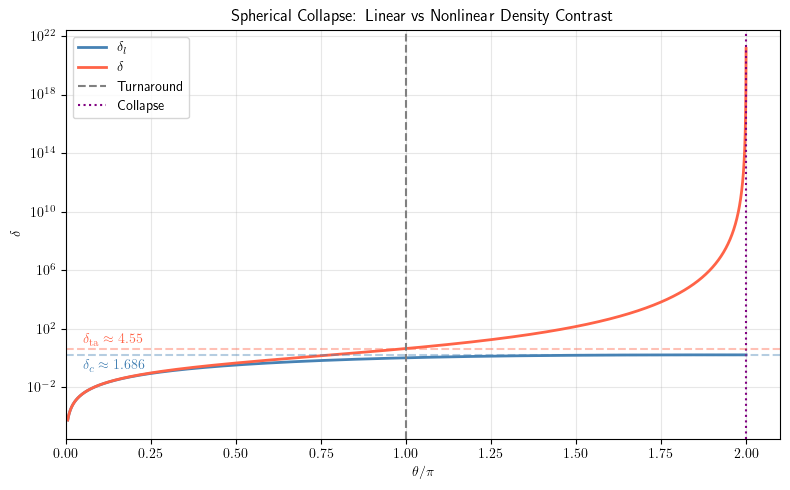

In [3]:
# Parameter range (avoid singularity at collapse)
th = np.linspace(0.02, 2*np.pi - 0.001, 20000)

# Matter-dominated flat universe: Ht = 2/3
Ht = 2/3

# Key normalization factor (your Eq. 35 structure)
key_ta = (np.pi / (2 * Ht))**(2/3)

def key_combo(th):
    return ((th - np.sin(th)) / np.pi)**(2/3) * key_ta

# Linear overdensity (extrapolated)
delta_l = (3/5) * key_combo(th)

# Nonlinear radius ratio
r_over_rl = (1 - np.cos(th)) / (2 * key_combo(th))

with np.errstate(divide='ignore', invalid='ignore'):
    delta = (1.0 / r_over_rl)**3 - 1

# ── diagnostics ───────────────────────────────────────────────────────
i_pi = np.argmin(np.abs(th - np.pi))

print(f"δ_l(turnaround) = {delta_l[i_pi]:.3f}   (≈ 1.06)")
print(f"δ  (turnaround) = {(3*np.pi/4)**2 - 1:.3f}   (≈ 4.55)")
print(f"δ_l(collapse)   = {(3/5)*(3*np.pi/2)**(2/3):.3f}   (≈ 1.686)")

# ── Single plot (log scale recommended) ───────────────────────────────
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(th/np.pi, delta_l, lw=2, label=r'$\delta_l$', color='steelblue')
ax.plot(th/np.pi, delta,   lw=2, label=r'$\delta$', color='tomato')

# Key markers
ax.axvline(1.0, ls='--', color='gray', label='Turnaround')
ax.axvline(2.0, ls=':', color='purple', label='Collapse')

# Known benchmark values
ax.axhline(1.686, ls='--', color='steelblue', alpha=0.4)
ax.text(0.05, 0.15, r'$\delta_c \approx 1.686$', color='steelblue')

ax.axhline((3*np.pi/4)**2 - 1, ls='--', color='tomato', alpha=0.4)
ax.text(0.05, 9, r'$\delta_{\mathrm{ta}} \approx 4.55$', color='tomato')

# Log scale (crucial for seeing divergence cleanly)
ax.set_yscale('log')

ax.set_xlabel(r'$\theta/\pi$')
ax.set_ylabel(r'$\delta$')
ax.set_title('Spherical Collapse: Linear vs Nonlinear Density Contrast')

ax.set_xlim(0)#, 2)
ax.legend(loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

---
## Key Takeaways: Spherical Collapse

| Quantity | Value | Meaning |
|---|---|---|
| $A$ | $= - GM/(2E)$ | Turnaround radius $r_{\rm ta} = 2A$ |
| $B$ | $= - GM/(2E)^{3/2}$ | Time scale: $t_{\rm col} = 2\pi B$ |
| $t_{\rm col}$ | $= 2\,t_{\rm ta}$ | Collapse time is twice the turnaround time |
| $\delta_l(t_{\rm ta})$ | $\approx 1.06$ | Linear $\delta$ at turnaround |
| $\delta(t_{\rm ta})$ | $\approx 4.55$ | Real $\delta$ at turnaround — already nonlinear |
| $\delta_c \equiv \delta_l(t_{\rm col})$ | $\approx 1.686$ | Universal collapse threshold |

**Ideas to take away:**

2. **Linear $\neq$ real.** Even though the real density diverges at collapse, the linearly-extrapolated
   $\delta_c = 1.686$ is a robust, universal threshold (it doesn't depend on the initial overdensity).

3. **$\delta_c = 1.686$ is the bridge to statistics.** Press-Schechter (next week) asks:
   *what fraction of regions have $\delta_l > \delta_c$?* That fraction equals the fraction of
   matter locked in collapsed halos — a direct connection to the observable halo mass function.

---
## Week 10 Preview: The Non-linear Mass and Press-Schechter Mass Function

This week established that a spherical region collapses when its linearly-extrapolated
density contrast crosses $\delta_c = 1.686$. Next week we turn this into a **statistical
prediction for the abundance of dark matter halos** as a function of mass and time.

The key idea: instead of asking about one particular region, we ask about the *ensemble*.

### Concept 1: The Non-linear Mass $M_*$

For a power-law power spectrum $P_\delta(k) = Ak^n$, the variance on scale $R$ scales as:
$$\sigma_R^2 \propto \int_0^{k_*} k^{n+2}\,dk \propto k_*^{n+3} \propto R^{-(n+3)} \propto M^{-(n+3)/3}$$

(using $k_* \sim 1/R$ and $M \propto R^3$). With the normalisation convention from the problem sheet,
this can be written:
$$\sigma_R^2 = \delta_c^2\left[\frac{M_*}{M(R)}\right]^{1+n/3}$$

where $M_* = M(R_*)$ is defined as the mass scale where $\sigma_* = \delta_c$ today.

**Physical meaning:**

| Mass range | $\sigma_R$ vs $\delta_c$ | Implication |
|---|---|---|
| $M > M_*$ | $\sigma_R < \delta_c$ | Typical fluctuations haven’t reached the threshold; halos this massive are **exponentially rare**|
| $M = M_*$ | $\sigma_R = \delta_c$ | This mass scale is going nonlinear **right now** |
| $M < M_*$ | $\sigma_R > \delta_c$ | Typical regions already crossed the threshold in the past; halos on these scales are **abundant** and formed earlier  |

$M_*$ is the **current frontier** of structure formation. 

### Concept 2: The Press-Schechter Mass Function

The Press-Schechter mass function gives the **comoving number density of halos** per unit mass:
$$N(M,a)\,dM = \sqrt{\frac{2}{\pi}}\,\frac{\bar\rho\,\delta_c}{M\,\sigma_R\,D(a)}
\left|\frac{d\ln\sigma_R}{d\ln M}\right|
\exp\!\left(-\frac{\delta_c^2}{2\sigma_R^2 D^2(a)}\right)dM$$

**Three things to notice:**

1. **Exponential cutoff at $M \gg M_*$:** the exponential kills the distribution for masses
   much larger than $M_*$, therefore massive halos are exponentially rare.
2. **Power-law at $M \ll M_*$:** the pre-factor gives a power law — many small halos exist.
3. **The $D(a)$ factor:** as the growth factor increases, $M_*$ grows and the mass function
   shifts to higher masses.

Using $\sigma_R^2 = \delta_c^2(M_*/M)^{1+n/3}$ with $m \equiv M/M_*$ and $\alpha = \frac{1}{2} + \frac{n}{6}$,
this can be rewritten in the **universal form** (which you will derive in Part 2):
$$N(M,a)\,dM = \alpha\sqrt{\frac{2}{\pi}}\,\frac{\bar\rho}{M_*}\,
\frac{m^{\alpha-2}}{D(a)}\,\exp\!\left(-\frac{m^{2\alpha}}{2D^2(a)}\right)dm$$

> **Intuition:** 
> - The prefactor $\bar\rho/M_*$ is roughly “halos per volume if all matter were in $M_*$-sized lumps”.
> - The exponential times power-law shape encodes the balance between large-scale rarity and small-scale abundance.
> - Integrating up to $M'$ gives the comoving number density of halos with $M < M'$. Multiplying by $M$ before integrating gives the mass fraction bound in halos below $M'$.

**What is \( D(a) \)?**  

$ D(a) $ is the **linear growth factor**, it tells you how much small density fluctuations have grown by the time the Universe reaches scale factor $ a $.  
In linear theory, overdensities evolve as  

$$
\delta(a) = D(a)\,\delta_{\text{initial}}.
$$

So $ D(a) $ is basically a **time-dependent amplification factor for structure formation**:
- Early times: $ D(a) \ll 1 $ → fluctuations are tiny  
- Later times: $ D(a) $ grows → overdensities become nonlinear and collapse into halos  
In the Press–Schechter formula, $ D(a) $ effectively rescales the collapse threshold:

$$
\delta_{\text{initial}} > \frac{\delta_c}{D(a)}.
$$

So as $ D(a) $ increases, it becomes easier for regions to collapse, and more (and more massive) halos form.

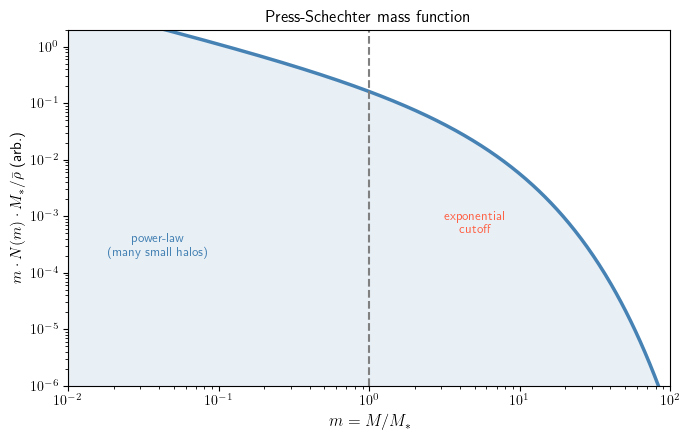

In [ ]:
Omega_m0  = 0.3
rho_crit0 = 2.775e11   # h^2 M_sun Mpc^-3  (standard)
rho_m0    = Omega_m0 * rho_crit0  # h^2 M_sun Mpc^-3

R8        = 8.0        # h^-1 Mpc
M8        = (4*np.pi/3) * rho_m0 * R8**3   # h^-1 M_sun

sigma8    = 0.8
delta_c   = 1.686
n_eff     = -1
alpha_ps  = 0.5 + n_eff/6.0   # = 1/3

M_star = M8 * (sigma8 / delta_c)**3

# ── Static Press-Schechter shape ───────────────────────────────────────────────
m_arr = np.logspace(-2, 2, 500)

def ps_shape(m, D=1.0, alpha=1.0/3.0):
    with np.errstate(over='ignore', invalid='ignore'):
        val = alpha * np.sqrt(2/np.pi) * m**(alpha-2) / D * np.exp(-m**(2*alpha)/(2*D**2))
    return np.where(np.isfinite(val), val, 0.0)

fig, ax = plt.subplots(figsize=(7, 4.5))
ax.loglog(m_arr, m_arr * ps_shape(m_arr), lw=2.5, color='steelblue')
ax.axvline(1.0, ls='--', color='gray') #, label='$M = M_*$ (today)')
ax.fill_between(m_arr, m_arr * ps_shape(m_arr), 1e-8, alpha=0.12, color='steelblue')
ax.set_xlabel(r'$m = M/M_*$', fontsize=12)
ax.set_ylabel(r'$m \cdot N(m) \cdot M_*/\bar\rho$ (arb.)', fontsize=11)
ax.set_title(r'Press-Schechter mass function', fontsize=12)
ax.set_xlim(1e-2, 1e2); ax.set_ylim(1e-6, 2)
#ax.legend(fontsize=10)
ax.text(5,   5e-4, 'exponential\ncutoff', color='tomato',    fontsize=9, ha='center')
ax.text(0.04, 2e-4, 'power-law\n(many small halos)', color='steelblue', fontsize=9, ha='center')
plt.tight_layout()
plt.show()

In [5]:
# ── Animation: Press-Schechter mass function evolving with growth factor D(a) ─
m_anim = np.logspace(-3, 3, 600)
D_vals = np.linspace(0.05, 1.0, 140)

fig_ps, ax_ps = plt.subplots(figsize=(8, 5))
fig_ps.patch.set_facecolor('#1a1a2e')
ax_ps.set_facecolor('#1a1a2e')
ax_ps.tick_params(colors='white')
ax_ps.xaxis.label.set_color('white'); ax_ps.yaxis.label.set_color('white')
ax_ps.title.set_color('white')
for sp in ax_ps.spines.values(): sp.set_edgecolor('white')

ax_ps.set_xlim(1e-3, 1e3); ax_ps.set_ylim(1e-6, 10)
ax_ps.set_xscale('log'); ax_ps.set_yscale('log')
ax_ps.set_xlabel(r'$m = M / M_*(a_0)$', fontsize=12)
ax_ps.set_ylabel(r'$m \cdot N(m) \cdot M_*/\bar\rho$', fontsize=12)
ax_ps.set_title('Press-Schechter: hierarchical structure formation', fontsize=12, pad=8)
ax_ps.axvline(1.0, ls=':', color='gray', lw=1)#, label='$M_*$ today')
#ax_ps.legend(loc='upper right', fontsize=9, facecolor='#1a1a2e', labelcolor='white')

line_ps, = ax_ps.plot([], [], lw=2.5, color='steelblue')
fill_ps  = [ax_ps.fill_between([], [], 1e-9, alpha=0.13, color='steelblue')]
txt_D    = ax_ps.text(0.75, 0.93, '', transform=ax_ps.transAxes,
                      fontsize=12, va='top', color='steelblue')
txt_note = ax_ps.text(0.04, 0.80, '', transform=ax_ps.transAxes,
                      fontsize=9,  va='top', color='gray')

def update_ps(frame):
    D = D_vals[frame]
    y = m_anim * ps_shape(m_anim, D=D)
    line_ps.set_data(m_anim, y)
    fill_ps[0].remove()
    fill_ps[0] = ax_ps.fill_between(m_anim, y, 1e-9, alpha=0.11, color='steelblue')
    txt_D.set_text(f'$D(a) = {D:.2f}$')
    return line_ps, txt_D, txt_note

ani_ps = animation.FuncAnimation(fig_ps, update_ps, frames=len(D_vals),
                                  interval=55, blit=False)
plt.tight_layout()
plt.close(fig_ps)
HTML(ani_ps.to_jshtml())

---
## Summary

### Key results from Week 9

1. **Parametric collapse solution:** $r = A(1-\cos\theta)$, $t = B(\theta-\sin\theta)$ with
   $A = GM/(2|E|)$, $B = GM/(2|E|)^{3/2}$. Only $E < 0$ gives a real, collapsing solution.

2. **Turnaround at $\theta = \pi$:** $\delta_l \approx 1.06$, $\delta \approx 4.55$.
   Linear theory is already a factor $\sim 4$ off by this point.

3. **Collapse at $\theta = 2\pi$:** $\delta_c \equiv \delta_l(t_{\rm col}) \approx 1.686$.
   This universal threshold is the cornerstone of Press-Schechter theory.

4. **$t_{\rm col} = 2\,t_{\rm ta}$:** the collapse time is exactly twice the turnaround time.